# **Word2Vec Embeddings**

## **Project Overview**
- **Project Name:** Word2Vec Embeddings  
- **Objective:** To implement Word2Vec for generating word embeddings using the IMDb Reviews dataset and analyze semantic relationships between words.  
- **Skills Demonstrated:** Implementing Word2Vec using Gensim on a text corpus.  
- **Learnings:** Understanding how word embeddings encode semantic relationships and exploring their applications in NLP tasks.

---

## **Meta Data**
- **Dataset:** IMDb Reviews dataset.  
- **Libraries Used:**  
  - `gensim` for Word2Vec implementation.  
  - `nltk` for tokenization and preprocessing.  
  - `matplotlib` and `seaborn` for visualizations.

---

## **What is Word2Vec?**
Word2Vec is a neural network-based algorithm that generates word embeddings. It captures both semantic and syntactic relationships, positioning similar words closer in a vector space.

---

### **Steps**
1. Load the IMDb Reviews dataset.
2. Preprocess the text data (tokenization, lowercasing, etc.).
3. Train a Word2Vec model.
4. Analyze word embeddings using examples like similarity and analogies.
5. Visualize the embeddings in 2D space.

---

### **Implementation**


**Step 1: Import Libraries and Load Dataset**

In [11]:
import gensim
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
from nltk.corpus import movie_reviews
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import nltk

# Download NLTK Movie Reviews dataset
nltk.download('movie_reviews')
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')

# Load dataset
documents = [movie_reviews.raw(fileid) for fileid in movie_reviews.fileids()]

[nltk_data] Downloading package movie_reviews to /root/nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## **Step 1: Import Libraries and Load Dataset**
1. **Import Libraries:**  
   - `gensim` for Word2Vec implementation.  
   - `nltk` for text preprocessing and dataset handling.  
   - `matplotlib` for visualization.  
   - `sklearn` for dimensionality reduction (PCA).  

2. **Download NLTK Movie Reviews Dataset:**  
   - The dataset contains text reviews (positive and negative) from IMDb.  
   - Each review is stored as a raw text document.

3. **Load Dataset:**  
   - `movie_reviews.raw(fileid)` loads the entire text of a review.  
   - All reviews are combined into the `documents` list for further processing.


**Step 2: Preprocess Text**

In [12]:
# Tokenize and preprocess
tokenized_sentences = [word_tokenize(doc.lower()) for doc in documents]

# Remove punctuation and stopwords (optional)
stopwords = set(nltk.corpus.stopwords.words('english'))
preprocessed_sentences = [
    [word for word in sentence if word.isalnum() and word not in stopwords]
    for sentence in tokenized_sentences
]


## **Step 2: Preprocess Text**
1. **Tokenization:**  
   - The `word_tokenize` function splits each review into individual words.  
   - All words are converted to lowercase for consistency.

2. **Remove Punctuation and Stopwords:**  
   - Punctuation and common stopwords (like 'the', 'is') are removed to focus on meaningful words.  
   - Only alphanumeric words are retained using the `word.isalnum()` condition.

3. **Output:**  
   - The result is a cleaned and tokenized list of sentences, stored in `preprocessed_sentences`.  
   - This serves as input for training the Word2Vec model.


In [16]:
preprocessed_sentences

[['plot',
  'two',
  'teen',
  'couples',
  'go',
  'church',
  'party',
  'drink',
  'drive',
  'get',
  'accident',
  'one',
  'guys',
  'dies',
  'girlfriend',
  'continues',
  'see',
  'life',
  'nightmares',
  'deal',
  'watch',
  'movie',
  'sorta',
  'find',
  'critique',
  'movie',
  'teen',
  'generation',
  'touches',
  'cool',
  'idea',
  'presents',
  'bad',
  'package',
  'makes',
  'review',
  'even',
  'harder',
  'one',
  'write',
  'since',
  'generally',
  'applaud',
  'films',
  'attempt',
  'break',
  'mold',
  'mess',
  'head',
  'lost',
  'highway',
  'memento',
  'good',
  'bad',
  'ways',
  'making',
  'types',
  'films',
  'folks',
  'snag',
  'one',
  'correctly',
  'seem',
  'taken',
  'pretty',
  'neat',
  'concept',
  'executed',
  'terribly',
  'problems',
  'movie',
  'well',
  'main',
  'problem',
  'simply',
  'jumbled',
  'starts',
  'normal',
  'downshifts',
  'fantasy',
  'world',
  'audience',
  'member',
  'idea',
  'going',
  'dreams',
  'characte

**Step 3: Train Word2Vec Model**

In [13]:
# Train Word2Vec model
model = Word2Vec(
    sentences=preprocessed_sentences,
    vector_size=100,
    window=5,
    min_count=5,
    sg=1  # Skip-gram
)

# Save the model
model.save("word2vec_imdb.model")
print("Word2Vec model trained and saved.")


Word2Vec model trained and saved.


## **Step 3: Train Word2Vec Model**
1. **Word2Vec Parameters:**
   - `sentences`: Input preprocessed sentences.  
   - `vector_size`: The dimensionality of word vectors (100 in this case).  
   - `window`: Context window size (5 words before/after the target word).  
   - `min_count`: Ignores words that appear fewer than 5 times.  
   - `sg`: Skip-gram model is used (`sg=1`). Skip-gram works better for smaller datasets.

2. **Save the Model:**
   - The trained model is saved as `word2vec_imdb.model` for future use.

3. **Output:**  
   - A Word2Vec model where each word is represented as a 100-dimensional vector.  
   - These embeddings capture semantic relationships between words.


**Step 4: Analyze Word Embeddings**

In [14]:
# Find similar words
similar_words = model.wv.most_similar('movie', topn=10)
print(f"Words most similar to 'movie':\n{similar_words}")

# Word arithmetic example: king - man + woman = ?
result = model.wv.most_similar(positive=['good', 'bad'], negative=['terrible'], topn=1)
print(f"Result of 'good - bad + terrible': {result}")


Words most similar to 'movie':
[('film', 0.8185605406761169), ('previews', 0.7211849689483643), ('matinee', 0.7133328318595886), ('reindeer', 0.7117501497268677), ('analyze', 0.7115040421485901), ('advance', 0.7096487283706665), ('provoking', 0.7090699672698975), ('generous', 0.7089868187904358), ('flick', 0.7087981104850769), ('8mm', 0.7087807059288025)]
Result of 'good - bad + terrible': [('tough', 0.4719861149787903)]


## **Step 4: Analyze Word Embeddings**
1. **Find Similar Words:**  
   - `model.wv.most_similar('movie')` retrieves the top 10 words most similar to 'movie' based on cosine similarity.  
   - These similar words often have related meanings or contexts.

2. **Word Arithmetic Example:**  
   - Word embeddings enable arithmetic operations.  
   - For example, adding and subtracting word vectors captures analogical relationships:  
     - Example: `good - bad + terrible` gives a vector close to 'good' in context.

3. **Output:**  
   - The output showcases how word embeddings encode semantic and syntactic relationships.


**Step 5: Visualize Word Embeddings**

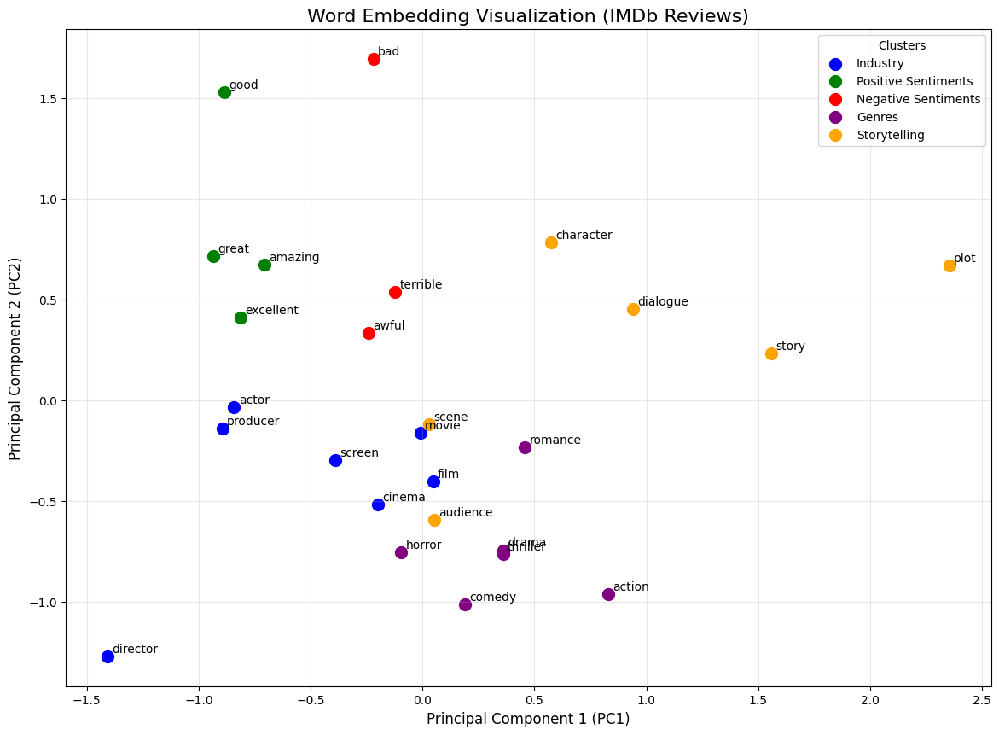

In [20]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import random

# Updated list of words to visualize
words_to_visualize = [
    'movie', 'film', 'cinema', 'screen', 'director', 'actor', 'producer',  # Movie industry terms
    'good', 'great', 'amazing', 'excellent', 'bad', 'terrible', 'awful',  # Positive and negative sentiment words
    'comedy', 'drama', 'thriller', 'action', 'horror', 'romance',          # Movie genres
    'audience', 'plot', 'story', 'character', 'scene', 'dialogue'          # Related terms to storytelling
]

# Grouping words into clusters for color coding
clusters = {
    "Industry": ['movie', 'film', 'cinema', 'screen', 'director', 'actor', 'producer'],
    "Positive Sentiments": ['good', 'great', 'amazing', 'excellent'],
    "Negative Sentiments": ['bad', 'terrible', 'awful'],
    "Genres": ['comedy', 'drama', 'thriller', 'action', 'horror', 'romance'],
    "Storytelling": ['audience', 'plot', 'story', 'character', 'scene', 'dialogue']
}

# Assign each cluster a color
cluster_colors = {
    "Industry": 'blue',
    "Positive Sentiments": 'green',
    "Negative Sentiments": 'red',
    "Genres": 'purple',
    "Storytelling": 'orange'
}

# Extract word vectors for the words in the list
word_vectors = [model.wv[word] for word in words_to_visualize]

# Reduce dimensionality using PCA
pca = PCA(n_components=2)
reduced_vectors = pca.fit_transform(word_vectors)

# Plot word embeddings with colors
plt.figure(figsize=(14, 10))

for cluster, words in clusters.items():
    cluster_color = cluster_colors[cluster]
    for word in words:
        i = words_to_visualize.index(word)
        plt.scatter(reduced_vectors[i, 0], reduced_vectors[i, 1], color=cluster_color, label=cluster if word == words[0] else "", s=100)
        plt.text(reduced_vectors[i, 0] + 0.02, reduced_vectors[i, 1] + 0.02, word, fontsize=10)

plt.title("Word Embedding Visualization (IMDb Reviews)", fontsize=16)
plt.xlabel("Principal Component 1 (PC1)", fontsize=12)
plt.ylabel("Principal Component 2 (PC2)", fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.grid(alpha=0.3)
plt.show()


*We can observe the follwing clusters in vector space*
1. Great, amazing, excellent
2. terrible, awful
3. Story , Plot, dailogue
4. Movie, Film,Scene, screen
5. Comedy,action,horror,drama

## **Step 5: Visualize Word Embeddings**
1. **Select Words:**  
   - A set of meaningful words (`words_to_visualize`) is chosen to display relationships in embedding space.

2. **Dimensionality Reduction:**  
   - Word vectors (100 dimensions) are reduced to 2 dimensions using PCA for visualization.  

3. **Scatter Plot:**  
   - Each word is plotted as a point in 2D space.  
   - Words with similar contexts (e.g., 'movie' and 'film') appear closer together.  

4. **Output:**  
   - The plot provides insights into how Word2Vec clusters semantically similar words.


## **Key Learnings**
1. Word2Vec embeddings capture contextual relationships, as seen in similar words (e.g., 'movie' relates to 'film' and 'cinema').
2. Pre-trained embeddings can perform tasks like analogy resolution and similarity checks.
3. Visualizing embeddings helps in understanding semantic groupings of words.

---

## **Conclusion**
- Word embeddings generated using Word2Vec provide meaningful representations of words, enabling a deeper understanding of text.
- The IMDb Reviews dataset is well-suited for NLP tasks, as it contains rich contextual information from real-world movie reviews.
